In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math
from collections import Counter
from subprocess import check_output
#看看文件是否存在，并且是不是用utf8
print(check_output(["ls", "input"]).decode("utf8"))

Authorization for Minor Form.rtf
child_wishlist_v2.csv
gift_goodkids_v2.csv
sample_submission_random_v2.csv



In [2]:
#孩子喜欢的礼物
gift_pref = pd.read_csv('input/child_wishlist_v2.csv',header=None).drop(0, 1).values
#礼物喜欢的孩子
child_pref = pd.read_csv('input/gift_goodkids_v2.csv',header=None).drop(0, 1).values

In [3]:
#有1000000个children
n_children = 1000000 
#1000种gift
n_gift_type = 1000
#每种gift1000个
n_gift_quantity = 1000 
#每个孩子有喜欢的100个礼物。(孩子开心)
n_gift_pref = 100 # number of gifts a child ranks
#每个礼物优先考虑1000个好孩子（圣诞老人开心）
n_child_pref = 1000 # number of children a gift ranks
#0-5000为三胞胎，triplets=50001 0.5%
triplets = math.ceil(0.005 * n_children / 3.) * 3    
#5001-45000双胞胎，即45000-5001+1=40000
twins = math.ceil(0.04 * n_children / 2.) * 2    
#根据目标函数里面定义的
ratio_gift_happiness = 2
ratio_child_happiness = 2

In [4]:
#三胞胎孩子
def Triplet_Hij(Children,prefer1, prefer2, prefer3):
    res=[[],[],[]]
    for p in list(set(list(prefer1) + list(prefer2) + list(prefer3))):        
        score = 0
        #对于三胞胎中的第一个人，偏爱有各种礼物的得分
        if p in list(prefer1):
            score += 2*(100 - list(prefer1).index(p))
        else:
            score -= 1
        #对于三胞胎中的第二个人
        if p in list(prefer2):
            score += 2*(100 - list(prefer2).index(p))
        else:
            score -= 1
        #对于三胞胎中的第三个人
        if p in list(prefer3):
            score += 2*(100 - list(prefer3).index(p))
        else:
            score -= 1
        res[0].append(p)
        res[1].append(2*score)
        res[2].append(-6)
    Children.append(res)
    Children.append(res)
    Children.append(res)

In [5]:
def Twin_Hij(Children,prefer1, prefer2):
    res=[[],[],[]]
    for p in list(set(list(prefer1) + list(prefer2))):
        score = 0
        if p in list(prefer1):
            score += 2*(100 - list(prefer1).index(p))
        else:
            score -= 1
        if p in list(prefer2):
            score += 2*(100 - list(prefer2).index(p))
        else:
            score -= 1
        res[0].append(p)
        res[1].append(3*score)
        res[2].append(-6)
    Children.append(res)
    Children.append(res) 

In [6]:
#普通孩子子
def Child_Hij(Children,prefer):
    res=[[],[],[]]
    for i in range(prefer.shape[0]):
        score = 12*(prefer.shape[0] - i)
        res[0].append(prefer[i])
        res[1].append(score)
        res[2].append(-6)
    Children.append(res)

In [7]:
#处理孩子偏爱的礼物
Children=[]
for i in range(0, 5001, 3):
    Triplet_Hij(Children,gift_pref[i], gift_pref[i+1], gift_pref[i+2])
for i in range(5001, 45001, 2):
    Twin_Hij(Children,gift_pref[i], gift_pref[i+1])
for i in range(45001, 1000000):
    Child_Hij(Children,gift_pref[i])

In [8]:
def index_of(in_list,val):
    try:
        return in_list.index(val)
    except ValueError:
        return -1 

In [9]:
#处理礼物偏爱的孩子
for j in range(1000):
    #每类礼物更偏爱的孩子
    cf = child_pref[j]
    done_list = []
    for i in range(cf.shape[0]):
        #同一礼物如果是三胞胎则以三胞胎中最先出现的为主。
        if cf[i] <= 5000 and cf[i] not in done_list:
            if cf[i] % 3 == 0:
                cid1 = cf[i]
                cid2 = cf[i] + 1
                cid3 = cf[i] + 2
                done_list.append(cid2)
                done_list.append(cid3)
            elif cf[i] % 3 == 1:
                cid1 = cf[i] - 1
                cid2 = cf[i]
                cid3 = cf[i] + 1
                done_list.append(cid1)
                done_list.append(cid3)
            else:
                cid1 = cf[i] - 2
                cid2 = cf[i] - 1
                cid3 = cf[i]
                done_list.append(cid1)
                done_list.append(cid2)
            if cid1 in list(cf):
                score_ = 2*(cf.shape[0] - list(cf).index(cid1))
            else:
                score_ = -1
            if cid2 in list(cf):
                score_ += 2*(cf.shape[0] - list(cf).index(cid2))
            else:
                score_ += -1
            if cid3 in list(cf):
                score_ += 2*(cf.shape[0] - list(cf).index(cid3))
            else:
                score_ += -1
            #判断孩子(cid1)是否偏爱礼物(j)
            index_triplet_pref=index_of(Children[cid1][0],j)
            #存在修改
            if index_triplet_pref>-1:
                #修改Hji
                Children[cid1][2][index_triplet_pref]=2*score_                
            else:
                #要添加
                Children[cid1][0].append(j)
                Children[cid1][1].append(-6)
                Children[cid1][2].append(2*score_)
            #判断孩子(cid1)是否偏爱礼物(j)
            index_triplet_pref=index_of(Children[cid2][0],j)
            if index_triplet_pref>-1:
                Children[cid2][2][index_triplet_pref]=2*score_
            else:
                Children[cid2][0].append(j)
                Children[cid2][1].append(-6)
                Children[cid2][2].append(2*score_)
            index_triplet_pref=index_of(Children[cid3][0],j)
            #存在修改
            if index_triplet_pref>-1:     
                Children[cid3][2][index_triplet_pref]=2*score_
            else:
                Children[cid3][0].append(j)                
                Children[cid3][1].append(-6)                                
                Children[cid3][2].append(2*score_)         
            #如果是双胞胎
            #以双胞胎最先出现的为主
        elif cf[i] <= 45000 and cf[i] not in done_list:
            if cf[i] % 2 == 1:
                cid1 = cf[i]
                cid2 = cf[i] + 1
                done_list.append(cid2)
            else:
                cid1 = cf[i] - 1
                cid2 = cf[i]
                done_list.append(cid1)
            if cid1 in list(cf):
                score_ = 2*(cf.shape[0] - list(cf).index(cid1))
            else:
                score_ = -1
            if cid2 in list(cf):
                score_ += 2*(cf.shape[0] - list(cf).index(cid2))
            else:
                score_ += -1
            #判断孩子(cid1)是否偏爱礼物(j)
            index_twin_pref=index_of(Children[cid1][0],j)
            #存在修改
            if index_twin_pref>-1:
                Children[cid1][2][index_twin_pref]=3*score_
            else:
                Children[cid1][0].append(j)
                Children[cid1][1].append(-6)
                Children[cid1][2].append(3*score_)
            #判断孩子(cid2)是否偏爱礼物(j)
            index_twin_pref=index_of(Children[cid2][0],j)
            if index_twin_pref>-1:
                Children[cid2][2][index_twin_pref]=3*score_
            else:
                #注原来的代码只在双胞胎或三胞胎的第一个上面加了礼物索引
                Children[cid2][0].append(j)                
                Children[cid2][1].append(-6)                
                Children[cid2][2].append(3*score_)                                
            #如果是普通孩子
        elif cf[i] > 45000:
            #判断孩子(cid1)是否偏爱礼物(j)
            cid=cf[i]
            score_=2*(cf.shape[0] - i)
            index_child_pref=index_of(Children[cid][0],j)
            if index_child_pref>-1:
                Children[cid][2][index_child_pref]=6*score_
            else:
                Children[cid][0].append(j)
                Children[cid][1].append(-6)
                Children[cid][2].append(6*score_)

In [10]:
print(len(Children[0][0]))
print(len(Children[1][0]))
print(len(Children[2][0]))

270
270
270


### 验证更改后是否正确(注：其中Children是我改的，Children1是原来的）
```python
import random
def validat_mychange(cid):
    #判断giftid的数量是否相等
    print(len(Children1[cid].prefer_dict.keys()))
    print(len(Children[cid][0]))
    #判断里面的值是否相等，随机取的一个
    random_giftid=random.choice(Children[cid][0])
    print(random_giftid)
    print(Children1[cid].prefer_dict[random_giftid])
    print(Children[cid][1][Children[cid][0].index(random_giftid)])
    print(Children[cid][2][Children[cid][0].index(random_giftid)])
```

### Summarize
至此有关Children的处理已经完毕，需要改进的是里面Score的计算。以后你们可以用本页中的Children了，我已经验证了准确性。速度加快了不少。
与原来的Children对比详见：Compare_Children.ipynb

### 下面的还未改完，晚点再改，我这都改完了就只剩下里面的参数调节了，和最大限度运用目标函数，将Score分摊到Cost上，这是创新点也是难点。

### 最小Cost最大流

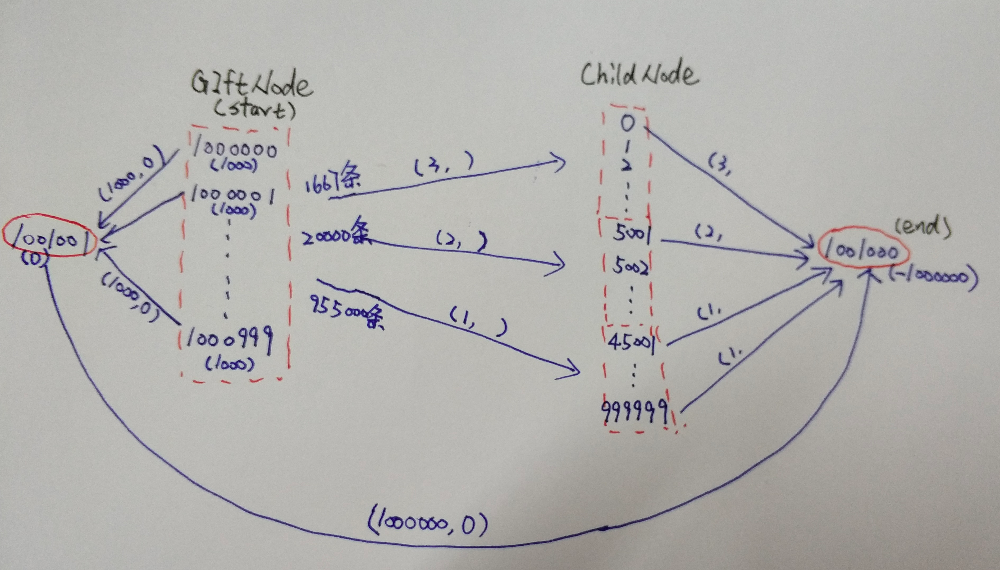

In [11]:
from ortools.graph import pywrapgraph

## 第一次构图

In [12]:
W_CHILD = 9020
W_GIFTS = 2

In [13]:
min_cost_flow_1 = pywrapgraph.SimpleMinCostFlow()

start_nodes = []
end_nodes = []
capacities = []
unit_costs = []

### 一定要纠正一个错误的观点：每个孩子并不是跟每个礼物都有连线的。

In [14]:
#构建Node()
# triplets
#遍历每个三胞胎孩子，看每个孩子偏爱的礼物，（如果存在孩子偏爱的礼物，或该礼物偏爱此孩子则以礼物为起点，孩子为终点，capacity为3，
#cost为两个score的加权画边）
for i in range(0, 5001, 3):
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(3)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
        
# triplets
for i in range(5001, 45001, 2):
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(2)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
        
# other children
for i in range(45001, 1000000):
    
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(1)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))


### 注意画的是什么样的边，是从$C_{i}->G_{j}个礼物的边（这个边是当H_{ij}或H_{ji}有一个存在的情况下才有边）$这也是为什么最后求得的解会有不满足三胞胎礼物都相同，双胞胎礼物都相同的原因

In [29]:
#开始画图了
# add Arc（画边，用上面的start_nodes-->end_nodes,即gift-->childern)
# gift -> children
for i in range(len(start_nodes)):
    min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(start_nodes[i]), int(end_nodes[i]), int(capacities[i]), int(unit_costs[i])
    )


In [ ]:
### 每个孩子节点都有到达终点的

In [30]:
# 1001000结点为孩子节点的集合结点，添加从每个收到礼物的孩子结点到此节点的一条路径，capacity=礼物数，cost为0,Good!
# children -> 1001000 : collection(孩子到终止节点)

for i in range(0, 5001, 3):
    min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(3), int(0)
    )
for i in range(5001, 45001, 2):
    min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(2), int(0)
    )
for i in range(45001, 1000000):
    min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(1), int(0)
    )

In [31]:
#gift结点到终止节点capacity=1000 and cost=0
# gift -> 1001001 : dust_gift
# 1001001结点为礼物结点的汇总节点，添加从每个礼物结点到汇总节点的容量为1000花费为0的通路
for i in range(1000):
    min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(1000000+i), int(1001001), int(1000), int(0)
    )
    

In [32]:
# 1001001 -> 1001000 : dust_path
# 添加从开始结点的汇总节点到结束结点的汇总节点的容量为1000000花费为0的通路
min_cost_flow_1.AddArcWithCapacityAndUnitCost(
        int(1001001), int(1001000), int(1000000), int(0)
    )

101550693

In [33]:
# add gift Supply
for i in range(1000):
    min_cost_flow_1.SetNodeSupply(int(1000000+i), int(1000))

In [34]:
# add children Supply
for i in range(0, 5001, 3):
    min_cost_flow_1.SetNodeSupply(int(i), int(0))
for i in range(5001, 45001, 2):
    min_cost_flow_1.SetNodeSupply(int(i), int(0))
for i in range(45001, 1000000):
    min_cost_flow_1.SetNodeSupply(int(i), int(0))

In [35]:
#孩子的终点处supply为-1000000
min_cost_flow_1.SetNodeSupply(int(1001000), int(-1000000)) 
#gift的终点处supply为0
min_cost_flow_1.SetNodeSupply(int(1001001), int(0)) 

In [36]:
min_cost_flow_1.Solve()

1

In [83]:
assignment = [-1]*1000000
twins_differ = []
triplets_differ = []

for i in range(min_cost_flow_1.NumArcs()):
    #有流量流过，并且这条边的head小于1000000（在这里面的head是指箭头指向的，小于1000000是child）
    if min_cost_flow_1.Flow(i) != 0 and min_cost_flow_1.Head(i) < 1000000:
        #child居然是Head，与我们直观的感觉有些不一样
        c = min_cost_flow_1.Head(i)
        g = min_cost_flow_1.Tail(i)
        f = min_cost_flow_1.Flow(i)
        #普通孩子
        if c >= 45001:
            assignment[c] = g - 1000000
        #双胞胎
        elif c >= 5001:
            #只有一个分配了礼物
            if f == 1:
                #指向这个礼物，并记录未满足条件的twin的childid
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    twins_differ.append([c, c+1])
                else:
                    assignment[c+1] = g - 1000000
            #两配了两个相同的，将两个相同的giftid赋给两个孩子
            elif f == 2:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
        #三胞胎 作同样的处理
        else:
            if f == 1:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                elif assignment[c+1] == -1:
                    assignment[c+1] = g - 1000000
                else:
                    assignment[c+2] = g - 1000000
            elif f == 2:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    assignment[c+1] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                else:
                    assignment[c+1] = g - 1000000
                    assignment[c+2] = g - 1000000
            elif f == 3:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
                assignment[c+2] = g - 1000000
   

CHILD_HAPPINESS=0
SANTA_HAPPINESS=0
for i in range(1000000):
    gift_id=assignment[i]
    gift_index=index_of(Children[i][0],gift_id)
    if gift_index==-1:
        Children[i][0].append(gift_id)
        Children[i][1].append(-6)
        Children[i][2].append(-6)
        CHILD_HAPPINESS+=-6
        SANTA_HAPPINESS+=-6
    else:
        CHILD_HAPPINESS+=Children[i][1][gift_index]
        SANTA_HAPPINESS+=Children[i][2][gift_index]
CHILD_HAPPINESS=CHILD_HAPPINESS*10

OBJ = CHILD_HAPPINESS**3 + SANTA_HAPPINESS**3
print(W_CHILD, W_GIFTS, CHILD_HAPPINESS, SANTA_HAPPINESS, OBJ)
print(OBJ / (12000000000**3))



9020 2 11739596220 1709307 1617929073662152820107354405443
0.9363015472581903


### 综上即使assignment里面有值也不一定是正确的匹配，所以下面就看了匹配错误的Twin和Triplets

In [84]:
len(twins_differ), len(triplets_differ)

(63, 2)

In [85]:
# well assigned twins and triplets
well_assigned = []
for i in range(0, 5001, 3):
    if assignment[i] == assignment[i+1] and assignment[i] == assignment[i+2]:
        well_assigned.append(i)
        well_assigned.append(i+1)
        well_assigned.append(i+2)
for i in range(5001, 45001, 2):
    if assignment[i] == assignment[i+1]:
        well_assigned.append(i)
        well_assigned.append(i+1)

In [86]:
#说明第一次只有44869个人匹配了礼物
len(well_assigned)

44869

In [87]:
#生成了1000个礼物，每个礼物1000个的list
Gifts_left = [1000 for _ in range(1000)]
for i in well_assigned:
    #如果第i个人已经分配了礼物，那么剩余礼物数减一
    if assignment[i] != -1:
        Gifts_left[assignment[i]] -= 1
#得到的Gifts_left就是每种礼物的剩余数量。
#Gifts_left

In [88]:
sum(Gifts_left)

958818

## 第二次构图

### <mark>第二次为什么选择这样的权重？</mark>

In [89]:
# add penalty for twins and triplets
W_CHILD = 90200000
W_GIFTS = 20000

### 第二次与第一次构图不同的地方：
- 对不是well_assigned的礼物重新分配
- 对于双胞胎和三胞胎cost的值加了1，对于普通孩子与第一次构图一样
- 改变了两个地方的Supply(很好理解）
    * min_cost_flow_2.SetNodeSupply(int(1000000+i), int(Gifts_left[i]))
    * min_cost_flow_2.SetNodeSupply(int(1001000), int(-sum(Gifts_left))) 

In [94]:
min_cost_flow_2 = pywrapgraph.SimpleMinCostFlow()

start_nodes = []
end_nodes = []
capacities = []
unit_costs = []


# triplets
for i in range(0, 5001, 3):
    if i not in well_assigned:
        for g in Children[i][0]:
            start_nodes.append(1000000+g)
            end_nodes.append(i)
            capacities.append(3)
            giftid_index=index_of(Children[i][0],g)
            unit_costs.append(1-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
            
# twins
for i in range(5001, 45001, 2):
    if i not in well_assigned:
        for g in Children[i][0]:
            start_nodes.append(1000000+g)
            end_nodes.append(i)
            capacities.append(2)
            giftid_index=index_of(Children[i][0],g)
            unit_costs.append(1-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
        
# other children
for i in range(45001, 1000000):
    
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(1)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))


# add Arc
# gift -> children
for i in range(len(start_nodes)):
    min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(start_nodes[i]), int(end_nodes[i]), int(capacities[i]), int(unit_costs[i])
    )
    
# children -> 1001000 : collection
for i in range(0, 5001, 3):
    min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(3), int(0)
    )
for i in range(5001, 45001, 2):
    min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(2), int(0)
    )
for i in range(45001, 1000000):
    min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(1), int(0)
    )
    
# gift -> 1001001 : dust_gift
for i in range(1000):
    min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(1000000+i), int(1001001), int(1000), int(0)
    )
    
# 1001001 -> 1001000 : dust_path
min_cost_flow_2.AddArcWithCapacityAndUnitCost(
        int(1001001), int(1001000), int(1000000), int(0)
    )


# add Supply
for i in range(1000):
    min_cost_flow_2.SetNodeSupply(int(1000000+i), int(Gifts_left[i]))

# children
for i in range(0, 5001, 3):
    min_cost_flow_2.SetNodeSupply(int(i), int(0))
for i in range(5001, 45001, 2):
    min_cost_flow_2.SetNodeSupply(int(i), int(0))
for i in range(45001, 1000000):
    min_cost_flow_2.SetNodeSupply(int(i), int(0))

min_cost_flow_2.SetNodeSupply(int(1001001), int(0)) 
min_cost_flow_2.SetNodeSupply(int(1001000), int(-sum(Gifts_left))) 

In [95]:
min_cost_flow_2.Solve()

1

In [96]:
assignment_0 = assignment.copy()

In [99]:
assignment = [-1]*1000000
# pre-assigned
for i in well_assigned:
    assignment[i] = assignment_0[i]
    
twins_differ = []
triplets_differ = []

for i in range(min_cost_flow_2.NumArcs()):
    if min_cost_flow_2.Flow(i) != 0 and min_cost_flow_2.Head(i) < 1000000:
        c = min_cost_flow_2.Head(i)
        g = min_cost_flow_2.Tail(i)
        f = min_cost_flow_2.Flow(i)

        if c >= 45001:
            assignment[c] = g - 1000000

        elif c >= 5001:
            if f == 1:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    twins_differ.append([c, c+1])
                else:
                    assignment[c+1] = g - 1000000
            elif f == 2:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
        else:
            if f == 1:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                elif assignment[c+1] == -1:
                    assignment[c+1] = g - 1000000
                else:
                    assignment[c+2] = g - 1000000
            elif f == 2:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    assignment[c+1] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                else:
                    assignment[c+1] = g - 1000000
                    assignment[c+2] = g - 1000000
            elif f == 3:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
                assignment[c+2] = g - 1000000

CHILD_HAPPINESS=0
SANTA_HAPPINESS=0
for i in range(1000000):
    gift_id=assignment[i]
    gift_index=index_of(Children[i][0],gift_id)
    CHILD_HAPPINESS+=Children[i][1][gift_index]
    SANTA_HAPPINESS+=Children[i][2][gift_index]
CHILD_HAPPINESS=CHILD_HAPPINESS*10

                
# CHILD_HAPPINESS = sum([Children[i][0] for i in range(1000000)])*10
# SANTA_HAPPINESS = sum([Children[i][1] for i in range(1000000)])
OBJ = CHILD_HAPPINESS**3 + SANTA_HAPPINESS**3
print(W_CHILD, W_GIFTS, CHILD_HAPPINESS, SANTA_HAPPINESS, OBJ)
print(OBJ / (12000000000**3))

90200000 20000 11739596220 1709307 1617929073662152820107354405443
0.9363015472581903

90200000 20000 11739520560 1717905 1617897791907092444706765608625
0.9362834443906785


In [100]:
len(twins_differ), len(triplets_differ)

(13, 0)

In [101]:
# well assigned twins and triplets
well_assigned = []
for i in range(0, 5001, 3):
    if assignment[i] == assignment[i+1] and assignment[i] == assignment[i+2]:
        well_assigned.append(i)
        well_assigned.append(i+1)
        well_assigned.append(i+2)
for i in range(5001, 45001, 2):
    if assignment[i] == assignment[i+1]:
        well_assigned.append(i)
        well_assigned.append(i+1)

In [102]:
Gifts_left = [1000 for _ in range(1000)]
for i in well_assigned:
    if assignment[i] != -1:
        Gifts_left[assignment[i]] -= 1

In [103]:
len(well_assigned)

44975

## 第三次构图

In [104]:
assignment_1 = assignment.copy()

In [107]:
# add penalty for twins and triplets
W_CHILD = 10000
W_GIFTS = 1

In [108]:
min_cost_flow_3 = pywrapgraph.SimpleMinCostFlow()

start_nodes = []
end_nodes = []
capacities = []
unit_costs = []

np.random.seed(71)

# triplets
for i in range(0, 5001, 3):
    if i not in well_assigned:
        for g in Children[i][0]:
            start_nodes.append(1000000+g)
            end_nodes.append(i)
            capacities.append(3)
            giftid_index=index_of(Children[i][0],g)
            unit_costs.append(np.random.choice(100)-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
            
# twins
for i in range(5001, 45001, 2):
    if i not in well_assigned:
        for g in Children[i][0]:
            start_nodes.append(1000000+g)
            end_nodes.append(i)
            capacities.append(2)
            giftid_index=index_of(Children[i][0],g)
            unit_costs.append(np.random.choice(100)-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))

# other children
for i in range(45001, 1000000):
    
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(1)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(np.random.choice(100)-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))

# add Arc
# gift -> children
for i in range(len(start_nodes)):
    min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(start_nodes[i]), int(end_nodes[i]), int(capacities[i]), int(unit_costs[i])
    )
    
# children -> 1001000 : collection
for i in range(0, 5001, 3):
    min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(3), int(0)
    )
for i in range(5001, 45001, 2):
    min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(2), int(0)
    )
for i in range(45001, 1000000):
    min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(1), int(0)
    )
    
# gift -> 1001001 : dust_gift
for i in range(1000):
    min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(1000000+i), int(1001001), int(1000), int(0)
    )
    
# 1001001 -> 1001000 : dust_path
min_cost_flow_3.AddArcWithCapacityAndUnitCost(
        int(1001001), int(1001000), int(1000000), int(0)
    )


# add Supply
for i in range(1000):
    min_cost_flow_3.SetNodeSupply(int(1000000+i), int(Gifts_left[i]))

# children
for i in range(0, 5001, 3):
    min_cost_flow_3.SetNodeSupply(int(i), int(0))
for i in range(5001, 45001, 2):
    min_cost_flow_3.SetNodeSupply(int(i), int(0))
for i in range(45001, 1000000):
    min_cost_flow_3.SetNodeSupply(int(i), int(0))

min_cost_flow_3.SetNodeSupply(int(1001001), int(0)) 
min_cost_flow_3.SetNodeSupply(int(1001000), int(-sum(Gifts_left))) 

In [109]:
min_cost_flow_3.Solve()

1

In [114]:
assignment = [-1]*1000000
# pre-assigned
for i in well_assigned:
    assignment[i] = assignment_1[i]
    
twins_differ = []
triplets_differ = []

for i in range(min_cost_flow_3.NumArcs()):
    if min_cost_flow_3.Flow(i) != 0 and min_cost_flow_3.Head(i) < 1000000:
        c = min_cost_flow_3.Head(i)
        g = min_cost_flow_3.Tail(i)
        f = min_cost_flow_3.Flow(i)

        if c >= 45001:
            assignment[c] = g - 1000000

        elif c >= 5001:
            if f == 1:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    twins_differ.append([c, c+1])
                else:
                    assignment[c+1] = g - 1000000
            elif f == 2:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
        else:
            if f == 1:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                elif assignment[c+1] == -1:
                    assignment[c+1] = g - 1000000
                else:
                    assignment[c+2] = g - 1000000
            elif f == 2:
                if assignment[c] == -1:
                    assignment[c] = g - 1000000
                    assignment[c+1] = g - 1000000
                    triplets_differ.append([c, c+1, c+2])
                else:
                    assignment[c+1] = g - 1000000
                    assignment[c+2] = g - 1000000
            elif f == 3:
                assignment[c] = g - 1000000
                assignment[c+1] = g - 1000000
                assignment[c+2] = g - 1000000
                

CHILD_HAPPINESS=0
SANTA_HAPPINESS=0
for i in range(1000000):
    gift_id=assignment[i]
    gift_index=index_of(Children[i][0],gift_id)
    CHILD_HAPPINESS+=Children[i][1][gift_index]
    SANTA_HAPPINESS+=Children[i][2][gift_index]
CHILD_HAPPINESS=CHILD_HAPPINESS*10

OBJ = CHILD_HAPPINESS**3 + SANTA_HAPPINESS**3
print(W_CHILD, W_GIFTS, CHILD_HAPPINESS, SANTA_HAPPINESS, OBJ)
print(OBJ / (12000000000**3))

10000 1 605686051920 5380605192 222199471819419869441434378513125888
128587.65730290502


In [115]:
len(twins_differ), len(triplets_differ)

(1, 0)

In [116]:
twins_differ

[[34267, 34268]]

In [117]:
# well assigned twins and triplets
well_assigned = []
for i in range(0, 5001, 3):
    if assignment[i] == assignment[i+1] and assignment[i] == assignment[i+2]:
        well_assigned.append(i)
        well_assigned.append(i+1)
        well_assigned.append(i+2)
for i in range(5001, 45001, 2):
    if assignment[i] == assignment[i+1]:
        well_assigned.append(i)
        well_assigned.append(i+1)

In [118]:
assignment[34267], assignment[34268]

(125, 207)

In [119]:
assignment_2 = assignment.copy()

### 注：assignment_2可以有两种手动匹配方式
- assignment[34267] = 207 assignment[34268] = 207
- assignment[34267] = 125 assignment[34268] = 125

In [142]:
# assign 125
assignment[34267] = 125
assignment[34268] = 125

In [143]:
Gifts_left = [1000 for _ in range(1000)]
for i in well_assigned:
    if assignment[i] != -1:
        Gifts_left[assignment[i]] -= 1
Gifts_left[125] -= 2

## 第四次构图

In [145]:
# add penalty for twins and triplets
W_CHILD = 10000
W_GIFTS = 1

In [146]:
# without twins
min_cost_flow_34267 = pywrapgraph.SimpleMinCostFlow()

start_nodes = []
end_nodes = []
capacities = []
unit_costs = []
      
# other children
for i in range(45001, 1000000):
    
    for g in Children[i][0]:
        start_nodes.append(1000000+g)
        end_nodes.append(i)
        capacities.append(1)
        giftid_index=index_of(Children[i][0],g)
        unit_costs.append(-W_CHILD*(Children[i][1][giftid_index] + 6)-W_GIFTS*(Children[i][2][giftid_index] + 6))
        
# add Arc
# gift -> children
for i in range(len(start_nodes)):
    min_cost_flow_34267.AddArcWithCapacityAndUnitCost(
        int(start_nodes[i]), int(end_nodes[i]), int(capacities[i]), int(unit_costs[i])
    )
    
# children -> 1001000 : collection
for i in range(45001, 1000000):
    min_cost_flow_34267.AddArcWithCapacityAndUnitCost(
        int(i), int(1001000), int(1), int(0)
    )
    
# gift -> 1001001 : dust_gift
for i in range(1000):
    min_cost_flow_34267.AddArcWithCapacityAndUnitCost(
        int(1000000+i), int(1001001), int(1000), int(0)
    )
    
# 1001001 -> 1001000 : dust_path
min_cost_flow_34267.AddArcWithCapacityAndUnitCost(
    int(1001001), int(1001000), int(1000000), int(0)
)


# children
for i in range(45001, 1000000):
    min_cost_flow_34267.SetNodeSupply(int(i), int(0))

min_cost_flow_34267.SetNodeSupply(int(1001001), int(0))

In [147]:
# add Supply
for i in range(1000):
    min_cost_flow_34267.SetNodeSupply(int(1000000+i), int(Gifts_left[i]))
    
min_cost_flow_34267.SetNodeSupply(int(1001000), int(-sum(Gifts_left)))

In [148]:
min_cost_flow_34267.Solve()

1

In [149]:
assignment = [-1]*1000000
# pre-assigned
for i in well_assigned:
    assignment[i] = assignment_2[i]

assignment[34267] = 125
assignment[34268] = 125

for i in range(min_cost_flow_34267.NumArcs()):
    if min_cost_flow_34267.Flow(i) != 0 and min_cost_flow_34267.Head(i) < 1000000:
        c = min_cost_flow_34267.Head(i)
        g = min_cost_flow_34267.Tail(i)
        assignment[c] = g - 1000000

CHILD_HAPPINESS=0
SANTA_HAPPINESS=0
for i in range(1000000):
    gift_id=assignment[i]
    gift_index=index_of(Children[i][0],gift_id)
    CHILD_HAPPINESS+=Children[i][1][gift_index]
    SANTA_HAPPINESS+=Children[i][2][gift_index]
CHILD_HAPPINESS=CHILD_HAPPINESS*10

OBJ = CHILD_HAPPINESS**3 + SANTA_HAPPINESS**3
print(W_CHILD, W_GIFTS, CHILD_HAPPINESS, SANTA_HAPPINESS, OBJ)
print(OBJ / (12000000000**3))

10000 1 11739598380 1713846 1617929966723770795818660491736
0.9363020640762563


In [150]:
unassigned_v = [0, 0, 0]
unassigned_v_ = [0, 0]
for i in range(5001):
    if assignment[i] == -1:
        unassigned_v[0] += 1
for i in range(5001, 45001):
    if assignment[i] == -1:
        unassigned_v[1] += 1
for i in range(45001, 1000000):
    if assignment[i] == -1:
        unassigned_v[2] += 1 
for i in range(0, 5001, 3):
    if assignment[i] == -1:
        unassigned_v_[0] += 1
for i in range(5001, 45001, 2):
    if assignment[i] == -1:
        unassigned_v_[1] += 1
unassigned_v, unassigned_v_

([2745, 956, 0], [915, 478])

In [151]:
Gifts_left = [1000 for _ in range(1000)]
for i in range(1000000):
    if assignment[i] != -1:
        Gifts_left[assignment[i]] -= 1
for i in range(1000):
    if Gifts_left[i] != 0:
        print(i, Gifts_left[i])
118 628
240 180
272 141
320 496
389 148
494 983
671 707
998 409

118 637
240 180
272 141
320 496
389 148
494 983
671 707
998 409


### 解线性方程
```python
M=np.zeros((10, 17))
from numpy.linalg import matrix_rank
matrix_rank(np.eye(4)) # Full rank matrix
```


In [152]:
gifts_for_trips = [637, 180, 141, 496, 148, 983, 707, 409]
gifts_for_twins = [4, 0, 6, 4, 4, 932, 2, 4]

for i in range(8):
    gifts_for_trips[i] -= gifts_for_twins[i]

In [153]:
gifts_left_list = []
for i in range(gifts_for_trips[0]):
    gifts_left_list.append(118)
for i in range(gifts_for_trips[1]):
    gifts_left_list.append(240)
for i in range(gifts_for_trips[2]):
    gifts_left_list.append(272)
for i in range(gifts_for_trips[3]):
    gifts_left_list.append(320)
for i in range(gifts_for_trips[4]):
    gifts_left_list.append(389)
for i in range(gifts_for_trips[5]):
    gifts_left_list.append(494)
for i in range(gifts_for_trips[6]):
    gifts_left_list.append(671)
for i in range(gifts_for_trips[7]):
    gifts_left_list.append(998)
    
for i in range(gifts_for_twins[0]):
    gifts_left_list.append(118)
for i in range(gifts_for_twins[1]):
    gifts_left_list.append(240)
for i in range(gifts_for_twins[2]):
    gifts_left_list.append(272)
for i in range(gifts_for_twins[3]):
    gifts_left_list.append(320)
for i in range(gifts_for_twins[4]):
    gifts_left_list.append(389)
for i in range(gifts_for_twins[5]):
    gifts_left_list.append(494)
for i in range(gifts_for_twins[6]):
    gifts_left_list.append(671)
for i in range(gifts_for_twins[7]):
    gifts_left_list.append(998)

In [154]:
assignment_3 = assignment.copy()

In [155]:
ind = 0
for i in range(1000000):
    if assignment[i] == -1:
        assignment[i] = gifts_left_list[ind]
        ind += 1

In [156]:
out = open('new.csv', 'w')
out.write('ChildId,GiftId\n')
for i in range(1000000):
    out.write(str(i) + ',' + str(assignment[i]) + '\n')
out.close()